<a href="https://colab.research.google.com/github/shengjiyang/DS-Unit-1-Sprint-3-Linear-Algebra/blob/master/module4-clustering/LS_DS_134_Clustering_Assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# K-Means Clustering

# 1) Use the "Breast Cancer Wisconsin (Diagnostic) Data Set" from Kaggle to try and cluster types of cancer cells. 

Here's the original dataset for your reference:

<https://www.kaggle.com/uciml/breast-cancer-wisconsin-data>

## This is a supervised learning dataset

(Because it has **labels** - The "diagnosis" column.)

In [163]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA # You don't necessarily have to use this
from sklearn.cluster import KMeans # You don't necessarily have to use this
from sklearn.preprocessing import StandardScaler # You don't necessarily have to use this

df = pd.read_csv("https://raw.githubusercontent.com/ryanleeallred/datasets/master/Cancer_Cells.csv")
print(df.shape)
df.head()

(569, 33)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [142]:
df = df.drop('Unnamed: 32', axis = 1)
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


## Now it's an unsupervised learning dataset

(Because we've removed the diagnosis label) - Use this version.

In [143]:
df = df.drop('diagnosis', axis=1)
df.head()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


## Let's do it!

- You might want to do some data exploration to see if you can find specific columns that will help you find distinct clusters of cells
- You might want to use the elbow method to decide on the number of clusters to use.


In [0]:
# Making a Copy of the DataFrame - Because it's good form.
copy = df.copy()

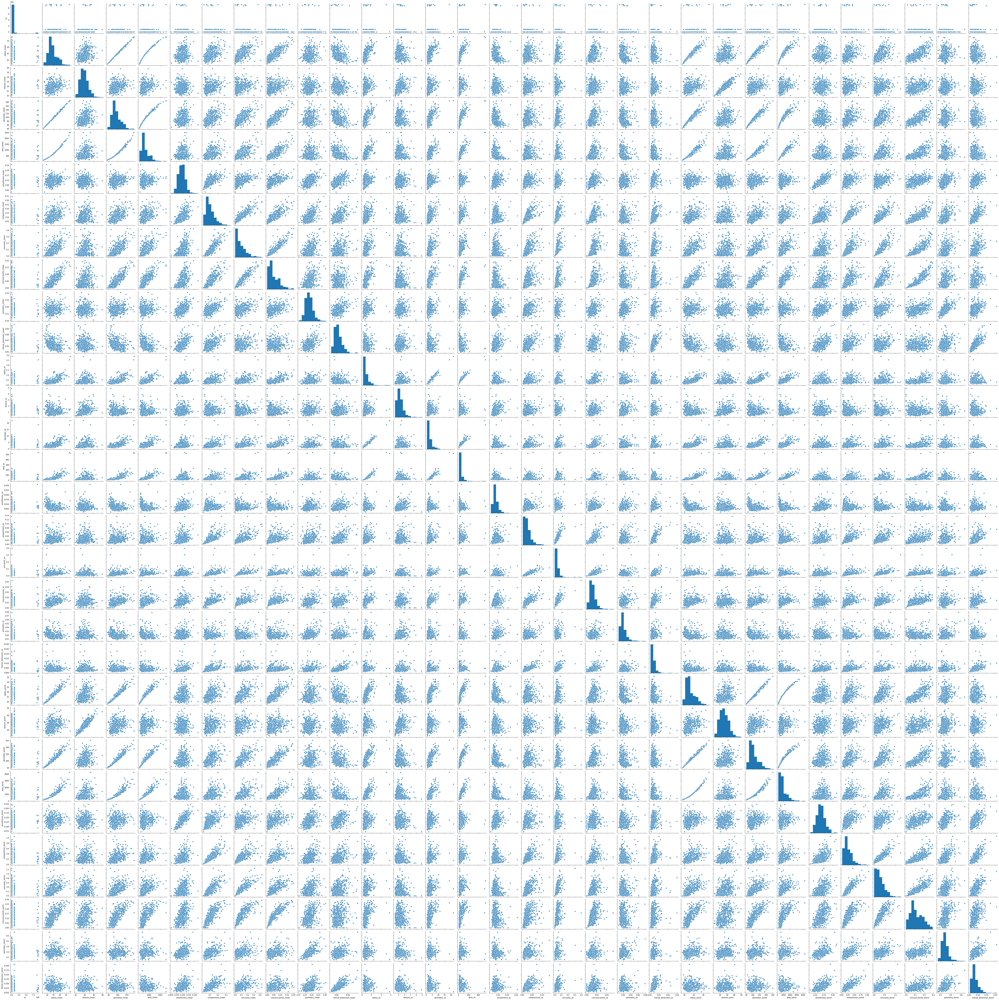

In [9]:
# Performing some thorough data exploration using Seaborn's Pairplot.
import seaborn as sns

sns.pairplot(copy)

In [84]:
# x1 = texture_mean
# x2 = smoothness_worst
# NOTE: Since diagnosis is ultimately what we want to predict,
# I have refrained from namming smoothness_worst y.

# This pair seems like a good candidate for clustering analysis
# given that it looks like a Lovecraftian monster.

subset = copy[['texture_mean', 'smoothness_worst']]
print(subset.shape)
subset.head()

(569, 2)


,texture_mean,smoothness_worst
0,10.38,0.1622
1,17.77,0.1238
2,21.25,0.1444
3,20.38,0.2098
4,14.34,0.1374


In [68]:
# Using the Elbow Method to determine how many clusters to use.

distortion = []
K = range(1, 16)
for k in K:
  km = KMeans(n_clusters = k)
  km = km.fit(subset)
  distortion.append(km.inertia_)

distortion

[10507.676239366105,
 3875.158300922189,
 1957.4155625699814,
 1208.1348435287468,
 845.7378048860596,
 608.346251997836,
 452.7251875829448,
 342.48862121839454,
 279.8114522763647,
 233.0221251088825,
 188.820834985087,
 160.253401255805,
 133.25336943817163,
 110.68172790879751,
 92.38432565705205]

In [0]:
distortion_differences.clear()

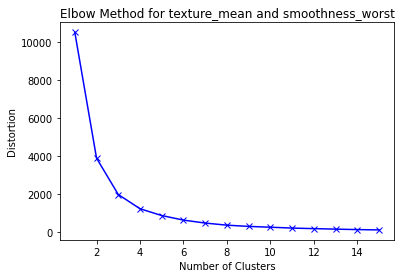

In [18]:
plt.plot(K, distortion, 'bx-')
plt.xlabel('Number of Clusters')
plt.ylabel('Distortion')
plt.title('Elbow Method for texture_mean and smoothness_worst');

In [26]:
# Calculating the differences in order to get an idea of the ideal number of
# clusters as determined by the Elbow Graph above.

distortion_differences = []

for i in range(1, 14):
  differences = distortion[i] - distortion[i + 1]
  distortion_differences.append(differences)

print(len(distortion_differences))
distortion_differences

# Based on the values below,
# 10 clusters appears to be the ideal number.

13


[1917.7427383522077,
 749.2807190412345,
 358.8298657941011,
 240.41677146345705,
 155.71724606715395,
 110.70881175283608,
 65.20226077317494,
 42.26881969627664,
 46.17023299666005,
 28.335484403966973,
 26.805187892810494,
 23.916516903829404,
 17.399196221298865]

In [38]:
# Now to perform the KMeans Clustering itself.

kmeans = KMeans(n_clusters = 10)
kmeans = kmeans.fit(subset)
np_clusters = kmeans.labels_


# There is such a beautiful "The Matrix" Quality about the output below.
print(np_clusters)

[7 8 4 5 3 2 5 5 4 0 0 1 0 0 4 6 5 5 4 3 2 7 3 4 4 8 4 5 0 2 0 1 0 6 1 4 4
 1 0 5 4 4 0 5 4 8 8 1 2 4 4 8 1 1 4 1 1 4 1 7 2 5 4 3 0 0 5 1 8 8 4 2 0 2
 8 5 7 2 0 1 5 2 0 6 2 1 4 0 4 2 0 4 2 1 5 4 1 5 3 5 0 3 5 5 1 2 1 1 5 4 8
 5 5 5 2 4 2 8 4 5 7 8 5 7 8 8 0 1 8 0 3 5 4 3 4 4 8 2 8 3 7 1 8 2 2 2 8 1
 2 1 5 5 2 3 2 1 5 5 3 3 5 2 1 4 4 5 7 1 0 8 7 5 7 2 2 3 1 5 4 3 4 6 5 2 4
 2 1 8 8 2 4 4 1 6 0 8 4 4 4 5 5 1 6 0 1 8 8 5 4 3 4 1 1 0 0 8 1 8 4 9 3 3
 8 5 8 3 2 2 0 4 1 6 9 6 2 4 6 4 6 9 2 2 1 0 0 5 8 3 0 2 0 1 5 8 1 8 6 8 0
 9 6 4 4 1 4 9 1 4 2 5 8 3 5 2 0 8 3 5 1 2 6 3 1 1 2 1 5 3 5 1 5 1 2 8 3 3
 7 1 1 4 1 5 0 1 1 0 2 3 3 3 1 2 3 7 1 8 3 1 1 8 2 5 3 4 2 8 3 1 5 4 2 1 5
 2 1 5 3 4 8 0 8 8 2 4 2 2 1 2 2 2 8 1 8 0 3 1 1 2 2 1 1 4 1 1 8 4 6 1 8 4
 0 3 2 8 2 2 5 6 2 1 3 2 4 8 3 0 3 2 2 0 7 8 5 4 8 8 1 8 2 8 5 7 1 2 2 1 2
 4 5 1 8 8 4 4 9 4 4 4 7 4 1 3 2 1 1 4 2 4 8 8 4 8 5 4 8 5 5 2 5 2 8 0 2 1
 8 0 6 8 1 5 4 0 6 3 8 9 6 0 0 6 6 6 6 1 1 5 5 1 0 1 1 6 2 9 2 2 5 8 2 5 1
 1 3 8 7 8 8 1 2 5 4 3 5 

In [85]:
clusters = pd.Series(np_clusters)
subset['clusters'] = clusters.values

subset.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,texture_mean,smoothness_worst,clusters
0,10.38,0.1622,7
1,17.77,0.1238,8
2,21.25,0.1444,4
3,20.38,0.2098,5
4,14.34,0.1374,3


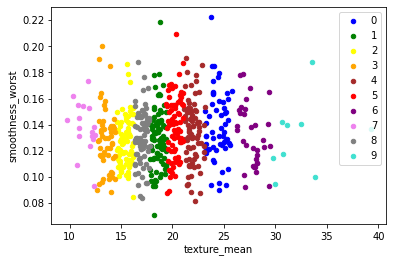

In [55]:
colors = {0 : 'blue', 1 : 'green', 2 : 'yellow', 3 : 'orange', 4 : 'brown',
          5 : 'red', 6 : 'purple', 7 : 'violet', 8 : 'grey', 9 : 'turquoise'}

fig, ax = plt.subplots()
grouped = subset.groupby('clusters')
for key, group in grouped:
    group.plot(ax = ax, kind = 'scatter', x = 'texture_mean',
               y = 'smoothness_worst', label = key, color = colors[key])
plt.show()

## Check you work: 

This is something that in a truly unsupervised learning situation **WOULD NOT BE POSSIBLE**. But for educational purposes go back and grab the true diagnosis column (label) from the original dataset. Take your cluster labels and compare them to the original diagnosis column. You can make scatterplots for each to see how they compare or you can calculate a percent accuracy score like: 
\begin{align}
\frac{\text{Num Correct Labels}}{\text{Num Total Observations}}
\end{align}

In [72]:
# I have brought the original DataFrame down for easy access.

original = pd.read_csv("https://raw.githubusercontent.com/ryanleeallred/datasets/master/Cancer_Cells.csv")
print(original.shape)
original.head()

(569, 33)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [86]:
diagnosis = original[['texture_mean', 'diagnosis']]
print(diagnosis.shape)
print(diagnosis['diagnosis'].value_counts())
diagnosis.head()

(569, 2)
B    357
M    212
Name: diagnosis, dtype: int64


,texture_mean,diagnosis
0,10.38,M
1,17.77,M
2,21.25,M
3,20.38,M
4,14.34,M


In [74]:
# Performing KMeans Clustering again on with k = 2

kmeans_2 = KMeans(n_clusters = 2)
kmeans_2 = kmeans_2.fit(subset)
np_clusters_2 = kmeans_2.labels_


print(np_clusters_2)

[0 0 1 1 0 0 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 0 0 1 1 0 1 1 1 0 1 0 1 1 0 1 1
 0 1 1 1 1 1 1 1 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 0 1 1 0 1 1 1 0 0 0 1 0 1 0
 0 0 0 0 1 0 1 0 1 1 0 0 1 1 1 0 1 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 1 0
 1 0 1 0 1 0 0 1 1 0 0 1 0 0 0 1 0 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 1 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 1 1 1 0 1
 0 0 0 0 0 1 1 0 1 1 0 1 1 1 1 0 0 1 1 0 0 0 1 1 0 1 0 0 1 1 0 0 0 1 1 0 0
 0 1 0 0 0 0 1 1 0 1 1 1 0 1 1 1 1 1 0 0 0 1 1 0 0 0 1 0 1 0 0 0 0 0 1 0 1
 1 1 1 1 0 1 1 0 1 0 1 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0
 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 1 0 0 1
 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0
 1 1 0 0 0 1 1 1 1 1 1 0 1 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0
 0 1 1 0 0 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 0 1 1 0 1 0 0 1 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 1 1 0 1 

In [87]:
clusters_2 = pd.Series(np_clusters_2)
subset['clusters_2'] = clusters_2.values

subset.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,texture_mean,smoothness_worst,clusters,clusters_2
0,10.38,0.1622,7,0
1,17.77,0.1238,8,0
2,21.25,0.1444,4,1
3,20.38,0.2098,5,1
4,14.34,0.1374,3,0


In [88]:
subset = subset.merge(diagnosis, on = 'texture_mean')
subset

,texture_mean,smoothness_worst,clusters,clusters_2,diagnosis
0,10.38,0.16220,7,0,M
1,17.77,0.12380,8,0,M
2,21.25,0.14440,4,1,M
3,21.25,0.14440,4,1,B
4,21.25,0.12870,4,1,M
...,...,...,...,...,...
762,22.39,0.14100,4,1,M
763,28.25,0.11660,6,1,M
764,28.08,0.11390,6,1,M
765,29.33,0.16500,6,1,M


In [89]:
print(subset.diagnosis.value_counts())

B    492
M    275
Name: diagnosis, dtype: int64

In [0]:
check_subset = subset.replace('M', 1).replace('B', 0)
check_subset

,texture_mean,smoothness_worst,clusters,clusters_2,diagnosis
0,10.38,0.16220,7,0,1
1,17.77,0.12380,8,0,1
2,21.25,0.14440,4,1,1
3,21.25,0.14440,4,1,0
4,21.25,0.12870,4,1,1
...,...,...,...,...,...
762,22.39,0.14100,4,1,1
763,28.25,0.11660,6,1,1
764,28.08,0.11390,6,1,1
765,29.33,0.16500,6,1,1


ERROR! Session/line number was not unique in database. History logging moved to new session 61


In [109]:
print('clusters_2: \n', check_subset.clusters_2.value_counts())
print('diagnosis: \n', check_subset.diagnosis.value_counts())

clusters_2: 
 0    477
1    290
Name: clusters_2, dtype: int64
diagnosis: 
 0    492
1    275
Name: diagnosis, dtype: int64


In [114]:
comparison = np.where(check_subset.clusters_2 == check_subset.diagnosis)

accuracy = len(comparison[0]) / len(check_subset.diagnosis)
accuracy

0.7379400260756193

In [115]:
# I'm rather surprised that the clustering is as spot-on as it is.
# In all honesty, there's now way of telling whether the binary values
# I chose at random actually match up to M and B,
# so the actually results could just as easily be 26.2% accurate,
# rather than the 73.8% shown above.

1 - accuracy

0.26205997392438074

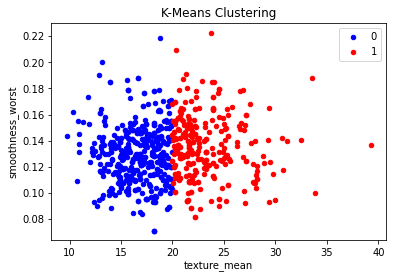

In [124]:
# Let's check this graphically in order to be sure about our conclusions.

# KMeans clustering
# Here I've effectively decided on the 26.2% conclusion.

colors_2 = {1 : 'red', 0 : 'blue'}

fig, ax = plt.subplots()
ax.set_title('K-Means Clustering')

grouped = subset.groupby('clusters_2')
for key, group in grouped:
    group.plot(ax = ax, kind = 'scatter', x = 'texture_mean',
               y = 'smoothness_worst', label = key, color = colors_2[key])
plt.show()

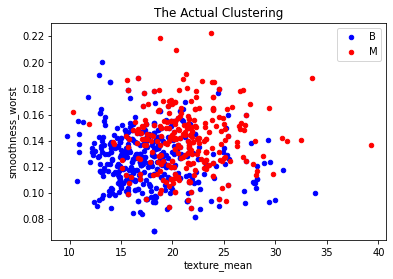

In [123]:
# The Actual Clustering

# I'm presuming that 'M' stands for malignant
# and that 'B' stand for benign,
# so malignant is red, and benign is blue. 

colors_2 = {'M' : 'red', 'B' : 'blue'}

fig, ax = plt.subplots()
ax.set_title('The Actual Clustering')

grouped = subset.groupby('diagnosis')
for key, group in grouped:
    group.plot(ax = ax, kind = 'scatter', x = 'texture_mean',
               y = 'smoothness_worst', label = key, color = colors_2[key])
plt.show()

# 2) Perform PCA on your dataset first and *then* use k-means clustering. 

- You need to standardize your data before PCA.
- First try clustering just on PC1 and PC2 so that you can make a scatterplot of your clustering.
- Then use use a scree plot to decide how many principal components to include in your clustering, and use however many principal components you need in order to retain 90% of the variation of the original dataset



In [164]:
# Bringing down the DataFrame because I forgot to remove id.

df = pd.read_csv("https://raw.githubusercontent.com/ryanleeallred/datasets/master/Cancer_Cells.csv")
print(df.shape)
df.head()

(569, 33)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [165]:
copy = df.drop(['id', 'diagnosis', 'Unnamed: 32'], axis = 1)

print(copy.shape)
copy.head()

(569, 30)


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [166]:
# Running PCA on copy

# Use StandardScaler to Standardize the Data
scaler = StandardScaler()

# fit_transform data
Z = scaler.fit_transform(X = copy)
print('Standardized Data: \n', Z)

Standardized Data: 
 [[ 1.09706398 -2.07333501  1.26993369 ...  2.29607613  2.75062224
   1.93701461]
 [ 1.82982061 -0.35363241  1.68595471 ...  1.0870843  -0.24388967
   0.28118999]
 [ 1.57988811  0.45618695  1.56650313 ...  1.95500035  1.152255
   0.20139121]
 ...
 [ 0.70228425  2.0455738   0.67267578 ...  0.41406869 -1.10454895
  -0.31840916]
 [ 1.83834103  2.33645719  1.98252415 ...  2.28998549  1.91908301
   2.21963528]
 [-1.80840125  1.22179204 -1.81438851 ... -1.74506282 -0.04813821
  -0.75120669]]


In [167]:
# Instantiation of PCA
# The number in PCA() is 7 because that's the number of eigenvectors
# needed to account for 90% of the variance in the data.
pca = PCA(7)

# Fitting PCA to the Data
pca.fit(Z)

# Eigenvalues and Eigenvectors
print('Eigenvalues: \n', pca.components_)
print('Eigenvectors: \n', pca.explained_variance_)

Eigenvalues: 
 [[ 2.18902444e-01  1.03724578e-01  2.27537293e-01  2.20994985e-01
   1.42589694e-01  2.39285354e-01  2.58400481e-01  2.60853758e-01
   1.38166959e-01  6.43633464e-02  2.05978776e-01  1.74280281e-02
   2.11325916e-01  2.02869635e-01  1.45314521e-02  1.70393451e-01
   1.53589790e-01  1.83417397e-01  4.24984216e-02  1.02568322e-01
   2.27996634e-01  1.04469325e-01  2.36639681e-01  2.24870533e-01
   1.27952561e-01  2.10095880e-01  2.28767533e-01  2.50885971e-01
   1.22904556e-01  1.31783943e-01]
 [-2.33857132e-01 -5.97060883e-02 -2.15181361e-01 -2.31076711e-01
   1.86113023e-01  1.51891610e-01  6.01653628e-02 -3.47675005e-02
   1.90348770e-01  3.66575471e-01 -1.05552152e-01  8.99796818e-02
  -8.94572342e-02 -1.52292628e-01  2.04430453e-01  2.32715896e-01
   1.97207283e-01  1.30321560e-01  1.83848000e-01  2.80092027e-01
  -2.19866379e-01 -4.54672983e-02 -1.99878428e-01 -2.19351858e-01
   1.72304352e-01  1.43593173e-01  9.79641143e-02 -8.25723509e-03
   1.41883349e-01  2.75339

In [168]:
pca.explained_variance_ratio_

array([0.44272026, 0.18971182, 0.09393163, 0.06602135, 0.05495768,
       0.04024522, 0.02250734])

In [169]:
pca.explained_variance_ratio_.sum()

0.9100953006924237

In [171]:
# Transform Data

Transformed = pca.transform(Z)
print('Projected Data: \n', Transformed)

Projected Data: 
 [[ 9.19283683  1.94858307 -1.12316617 ... -1.19511013  1.41142443
   2.1593678 ]
 [ 2.3878018  -3.76817174 -0.52929269 ...  0.62177499  0.02865636
   0.01335919]
 [ 5.73389628 -1.0751738  -0.55174759 ... -0.17708589  0.54145214
  -0.66816629]
 ...
 [ 1.25617928 -1.90229671  0.56273053 ...  1.80999133 -0.53444719
  -0.19275826]
 [10.37479406  1.67201011 -1.87702933 ... -0.03374194  0.56793647
   0.22308007]
 [-5.4752433  -0.67063679  1.49044308 ... -0.18470331  1.61783736
   1.69895083]]


In [175]:
# Making a DataFrame for the new data.
pca_df = pd.DataFrame(Transformed)
pca_df.columns = ['pc1', 'pc2', 'pc3', 'pc4', 'pc5', 'pc6', 'pc7']

print(pca_df.shape)
pca_df.head()

(569, 7)


,pc1,pc2,pc3,pc4,pc5,pc6,pc7
0,9.192837,1.948583,-1.123166,3.633731,-1.195110,1.411424,2.159368
1,2.387802,-3.768172,-0.529293,1.118264,0.621775,0.028656,0.013359
2,5.733896,-1.075174,-0.551748,0.912083,-0.177086,0.541452,-0.668166
3,7.122953,10.275589,-3.232790,0.152547,-2.960878,3.053422,1.429911
4,3.935302,-1.948072,1.389767,2.940639,0.546747,-1.226495,-0.936213


In [184]:
# Now to run K-means clustering on pc1 and pc2

pca_subset = pca_df[['pc1', 'pc2']]
pca_subset.head()

,pc1,pc2
0,9.192837,1.948583
1,2.387802,-3.768172
2,5.733896,-1.075174
3,7.122953,10.275589
4,3.935302,-1.948072


In [0]:
pca_kmeans = KMeans(n_clusters = 2)
pca_kmeans = pca_kmeans.fit(pca_subset)
np_subset_clusters = pca_kmeans.labels_

np_subset_clusters

In [188]:
pca_clusters = pd.Series(np_subset_clusters)
pca_subset['clusters'] = pca_clusters.values

pca_subset.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,pc1,pc2,clusters
0,9.192837,1.948583,1
1,2.387802,-3.768172,1
2,5.733896,-1.075174,1
3,7.122953,10.275589,1
4,3.935302,-1.948072,1


In [189]:
diagnosis_column = original.diagnosis
pca_subset['diagnosis'] = diagnosis_column

pca_subset.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,pc1,pc2,clusters,diagnosis
0,9.192837,1.948583,1,M
1,2.387802,-3.768172,1,M
2,5.733896,-1.075174,1,M
3,7.122953,10.275589,1,M
4,3.935302,-1.948072,1,M


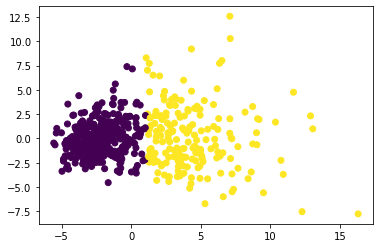

In [196]:
# Now to visualize the difference.

plt.scatter(pca_df['pc1'], pca_df['pc2'], c = pca_subset['clusters']);

# Looks like Hong Kong.
# Seriously, look at a map of Hong Kong and tell me it doesn't look like that.

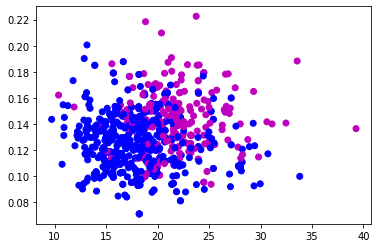

In [195]:
# Without PCA - For Comparison

plt.scatter(subset.texture_mean, subset.smoothness_worst, c = subset.diagnosis);

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Support for uppercase single-letter colors is deprecated since Matplotlib 3.1 and will be removed in 3.3; please use lowercase instead.
  after removing the cwd from sys.path.


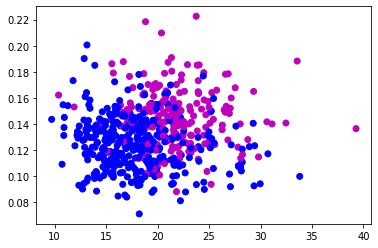

In [194]:
# The Actual Clustering - For Comparison

plt.scatter(original.texture_mean,
            original.smoothness_worst,
            c = original.diagnosis);

In [197]:
pca_binary = pca_subset.replace('M', 1).replace('B', 0)

pca_binary.head()

,pc1,pc2,clusters,diagnosis
0,9.192837,1.948583,1,1
1,2.387802,-3.768172,1,1
2,5.733896,-1.075174,1,1
3,7.122953,10.275589,1,1
4,3.935302,-1.948072,1,1


In [0]:
pca_comparison = np.where(pca_binary.clusters == pca_binary.diagnosis)

pca_comparison

In [204]:
pca_accuracy = len(pca_comparison[0]) / len(pca_binary.diagnosis)

print('Accuracy Without PCA: ', round(accuracy * 100, 2), '%')
print('Accuracy With PCA: ', round(pca_accuracy * 100, 2), '%')
print('\n \n I believe this demonstrates why we use PCA.')

Accuracy Without PCA:  73.79 %
Accuracy With PCA:  90.69 %

 
 I believe this demonstrates why we use PCA.


## Check your work: 

- Compare your PC1, PC2 clustering scatterplot to the clustering scatterplots you made on the raw data
- Calculate accuracy scores for both the PC1,PC2 Principal component clustering and the 90% of explained variance clustering.

How do your accuracy scores -when preprocessing the data with PCA- compare to the accuracy when simply clustering on the raw data?

# Stretch Goals:

- Study for the Sprint Challenge
- Work on your Data Storytelling Project